In [34]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
import requests
from shapely.geometry import Polygon
import numpy as np
import seaborn as sns
import time
from IPython.display import Image
from numpy import unravel_index



In [35]:
states = ["sinaloa","michoacan","guerrero","veracruz"]
df_state = []
for state in states:
    filename= "data/"+state+".csv"
    df = gpd.read_file(filename)
    df_state.append(df)

s, 52 included latitude and longitude data. These points are shown in Fig. 1.The travel time and visibility maps where generated following [15], where theurban settlement layer was acquired from the National Institute for Statistics, Ge-ography and Informatics (INEGI), the road networks from the Mexican TransportInstitute (IMT) and open street Maps (OSM), and the digital elevation model fromNASA’s shuttle radar topography mission (SRTM



In [36]:
df_state[3].head()

,system:index,TiempoViaje,Visibilidad,layer,.geo,geometry
0,0_0,4.054536987229765,3.0,Puntos de Hallazgo,"{""type"":""Point"",""coordinates"":[-97.52461119812...",None
1,0_1,35.94113854996112,0.0,Puntos de Hallazgo,"{""type"":""Point"",""coordinates"":[-96.33708124197...",None
2,0_2,8.526271043810116,6.0,Puntos de Hallazgo,"{""type"":""Point"",""coordinates"":[-96.85377957654...",None
3,0_3,1.166997347753456,2.0,Puntos de Hallazgo,"{""type"":""Point"",""coordinates"":[-96.73261242361...",None
4,0_4,28.38684297771805,30.0,Puntos de Hallazgo,"{""type"":""Point"",""coordinates"":[-96.68988085822...",None


In [37]:
for i in range(len(df_state)):
    df_state[i] = df_state[i].rename(columns={"TiempoViaje": "transportation_time", "Visibilidad": "visibility"})
    #df_state[i] = df_state[i].drop(['system:index', 'layer'], axis=1)
df_state[3].head()


,system:index,transportation_time,visibility,layer,.geo,geometry
0,0_0,4.054536987229765,3.0,Puntos de Hallazgo,"{""type"":""Point"",""coordinates"":[-97.52461119812...",None
1,0_1,35.94113854996112,0.0,Puntos de Hallazgo,"{""type"":""Point"",""coordinates"":[-96.33708124197...",None
2,0_2,8.526271043810116,6.0,Puntos de Hallazgo,"{""type"":""Point"",""coordinates"":[-96.85377957654...",None
3,0_3,1.166997347753456,2.0,Puntos de Hallazgo,"{""type"":""Point"",""coordinates"":[-96.73261242361...",None
4,0_4,28.38684297771805,30.0,Puntos de Hallazgo,"{""type"":""Point"",""coordinates"":[-96.68988085822...",None


particle 
search through space

reward is to find bones
state geo data

optimization problem RL optimizer

non to coordinates
learns characteristics and not space
CNN

1. obtener cuadrantes de un estado
2. obtener visibilidad por cuadrante 
3. obtener transportation time por cuadrante
4. tabla should be cuadrante id vis, time, fosa T/F

5. obtener rewards a través de la tabla


6. do the grid thing with the HW data
7. do the grid thing with my data
-8. see if something could be pulled up
-7. ver ke se akomoda

In [38]:
req_dc = requests.get('https://raw.githubusercontent.com/strotgen/mexico-leaflet/master/states.geojson')
json_dc = req_dc.json()

geo_df = gpd.GeoDataFrame.from_features((json_dc))
geo_df.drop(columns=["id"])
geo_df.head()

,geometry,id,state_code,state_name
0,"POLYGON ((-99.09052 19.50926, -99.06421 19.498...",None,9,Distrito Federal
1,"POLYGON ((-100.53878 18.84399, -100.50201 18.8...",None,12,Guerrero
2,"POLYGON ((-99.85919 20.26838, -99.85950 20.264...",None,15,México
3,"POLYGON ((-99.06199 19.04877, -99.02935 19.085...",None,17,Morelos
4,"POLYGON ((-108.47046 27.03457, -108.42165 27.0...",None,25,Sinaloa


In [39]:
def create_grid(poly, n_rows, n_cols):
    """
    Creates a grid of squares with equal area inside a polygon.
    A geopandas GeoDataFrame with n_rows * n_cols squares inside the given polygon. 
    """
    # Get the bounding box of the polygon
    minx, miny, maxx, maxy = poly.bounds
    
    wide = (maxx - minx) / float(n_cols)
    length = (maxy - miny) / float(n_rows)

    # Create a list of cells for the grid
    cols = list(np.arange(minx, maxx + wide, wide))
    rows = list(np.arange(miny, maxy + length, length))

    polygons = []
    for x in cols[:-1]:
        for y in rows[:-1]:
            polygons.append(Polygon([(x,y), (x+wide, y), (x+wide, y+length), (x, y+length)]))

    grid = gpd.GeoDataFrame({'geometry':polygons})

    return grid
geo_slice = geo_df.query("state_name == 'Veracruz de Ignacio de la Llave'")
grid_full = create_grid(geo_df["geometry"][25], 20,20)
grid_full

,geometry
0,"POLYGON ((-98.68194 17.13680, -98.42825 17.136..."
1,"POLYGON ((-98.68194 17.40335, -98.42825 17.403..."
2,"POLYGON ((-98.68194 17.66989, -98.42825 17.669..."
3,"POLYGON ((-98.68194 17.93644, -98.42825 17.936..."
4,"POLYGON ((-98.68194 18.20298, -98.42825 18.202..."
...,...
395,"POLYGON ((-93.86180 21.13498, -93.60811 21.134..."
396,"POLYGON ((-93.86180 21.40152, -93.60811 21.401..."
397,"POLYGON ((-93.86180 21.66806, -93.60811 21.668..."
398,"POLYGON ((-93.86180 21.93461, -93.60811 21.934..."


In [40]:
cell = grid_full.iloc[(1 - 3 - 1) * 1 + 2]

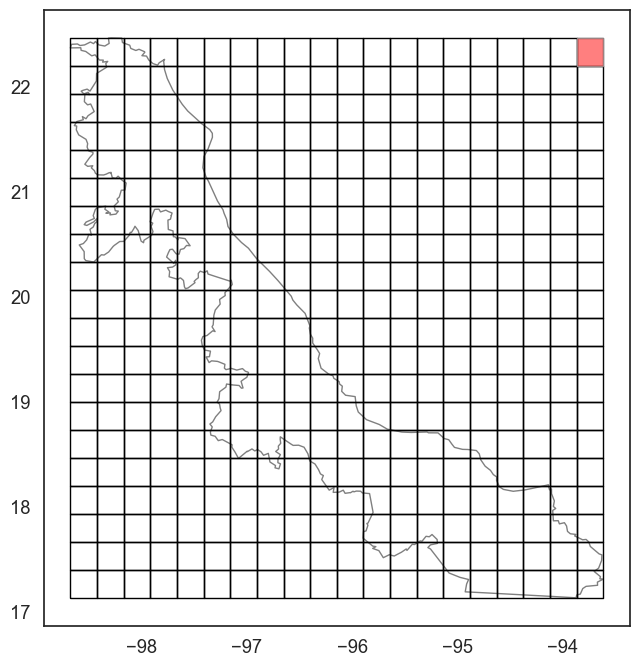

In [41]:
cell_geom = cell.geometry
cell_gdf = gpd.GeoDataFrame(geometry=[cell_geom])

ax = geo_slice.plot(color='none', edgecolor='black',figsize=(8,8), alpha=0.5)
grid_full.plot(ax=ax, color='none', edgecolor='black')
cell_gdf.plot(ax=ax, color='red', alpha=0.5)

plt.show()

In [42]:
def create_grid(poly, n_rows, n_cols):
    """
    Creates a grid of squares with equal area inside a polygon.
    A geopandas GeoDataFrame with n_rows * n_cols squares inside the given polygon. 
    """
    # Get the exterior ring of the polygon
    ext_ring = poly.exterior

    # Calculate the width and height of each cell
    width = ext_ring.length / float(n_cols)
    height = poly.area / (width * float(n_rows))

    polygons = []
    for j in range(n_rows):
        for i in range(n_cols):
            # Calculate the vertices of the cell
            x_min = ext_ring.bounds[0] + i * width
            y_min = ext_ring.bounds[1] + j * height
            x_max = x_min + width
            y_max = y_min + height
            vertices = [(x_min, y_min), (x_max, y_min), (x_max, y_max), (x_min, y_max)]

            # Create the cell polygon and add it to the list
            cell_poly = Polygon(vertices)
            if cell_poly.intersects(poly):
                polygons.append(cell_poly)
            # Create a GeoDataFrame from the polygons
    grid = gpd.GeoDataFrame({'geometry': polygons})

    return grid
grid = create_grid(geo_df["geometry"][25], 100,100)

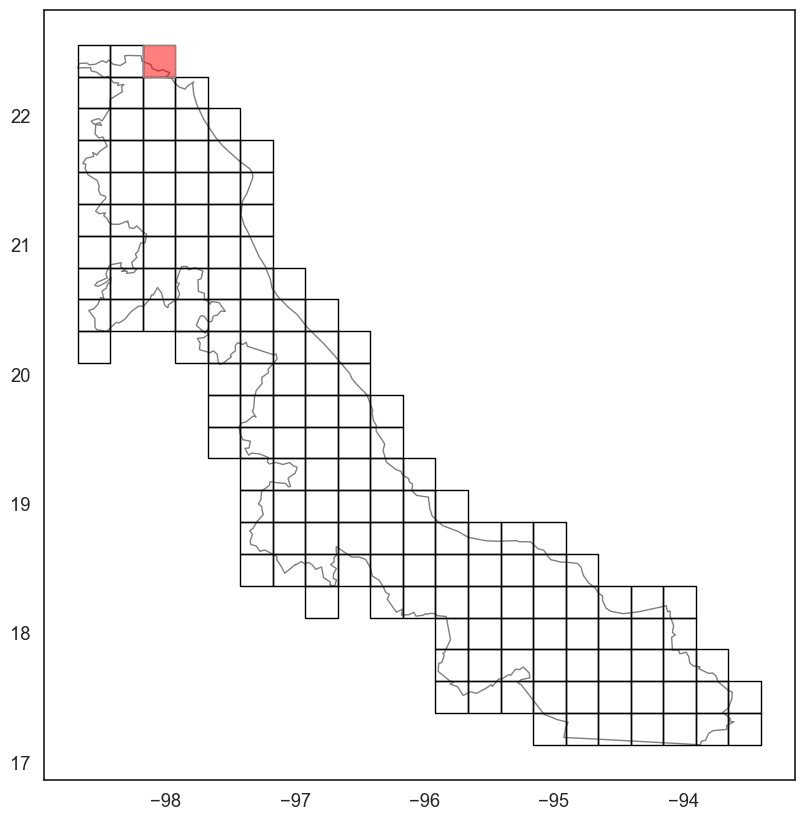

In [43]:
n_rows = 1
n_cols = 1
cell = grid.iloc[(n_rows - 3 - 1) * n_cols + 2]['geometry']
cell_geom = cell
cell_gdf = gpd.GeoDataFrame(geometry=[cell_geom])

geo_slice = geo_df.query("state_name == 'Veracruz de Ignacio de la Llave'")
ax = geo_slice.plot(color='none', edgecolor='black',figsize=(10,10), alpha=0.5)
grid.plot(ax=ax, color='none', edgecolor='black')
cell_gdf.plot(ax=ax, color='red', alpha=0.5)

plt.show()

In [44]:
sina_gp = gpd.read_file("C:\\repos\\591\\project\\data\\veracruz.geojson")
sina_gp.head(3)

,id,TiempoViaje,Visibilidad,layer,geometry
0,0_0,4.054537,6.26,Puntos de Hallazgo,POINT (-97.52461 20.73558)
1,0_1,35.941139,5.10,Puntos de Hallazgo,POINT (-96.33708 19.45803)
2,0_2,8.526271,12.55,Puntos de Hallazgo,POINT (-96.85378 19.36461)


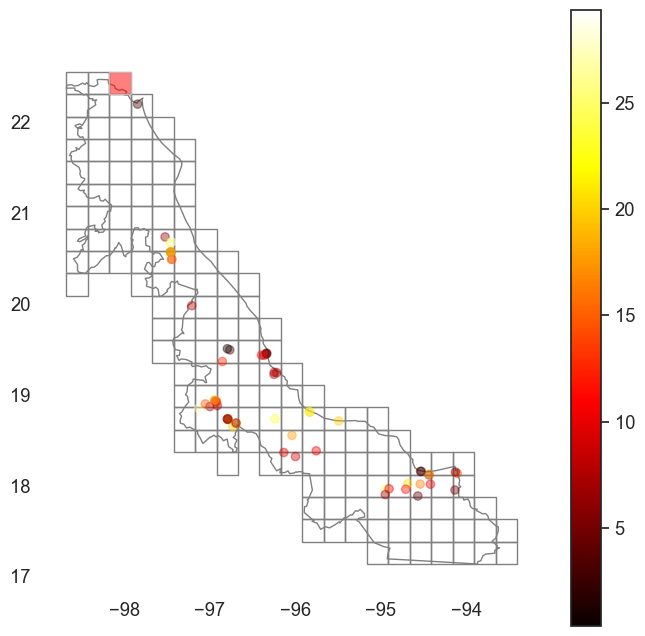

In [45]:
import seaborn as sns

cell = grid.iloc[(n_rows - 3 - 1) * n_cols + 2]['geometry']
cell_geom = cell
cell_gdf = gpd.GeoDataFrame(geometry=[cell_geom])

ax = geo_slice.plot(color='none', edgecolor='black', figsize=(8,8), alpha=0.5)

sns.set_style("white")
sns.despine(left=True, bottom=True)
sns.set_context("notebook", font_scale=1.2)

grid.plot(ax=ax, color='none', edgecolor='grey')
cell_gdf.plot(ax=ax, color='red', alpha=0.5)

data = sina_gp[['geometry', 'Visibilidad']]
data.plot(column='Visibilidad', cmap='hot', legend=True, ax=ax, alpha=0.4)

#data = sina_gp[['geometry', 'TiempoViaje']]
#data.plot(column='TiempoViaje', cmap='Blues', legend=True, ax=ax, alpha=0.4)

plt.show()


hasta aqui el mapa chulo to bien tamos contentos hoy amaneci contentO HOY AMANECI FELIZ

In [46]:
max_value = sina_gp["Visibilidad"].max()
min_value = sina_gp["Visibilidad"].min()
sina_gp["Visibilidad"] = (sina_gp["Visibilidad"] - min_value) / (max_value - min_value)

max_value = sina_gp["TiempoViaje"].max()
min_value = sina_gp["TiempoViaje"].min()
sina_gp["TiempoViaje"] = (sina_gp["TiempoViaje"] - min_value) / (max_value - min_value)

sina_gp["features"] = sina_gp["TiempoViaje"]+sina_gp["Visibilidad"]
max_value = sina_gp["features"].max()
min_value = sina_gp["features"].min()
sina_gp["features"] = (sina_gp["features"] - min_value) / (max_value - min_value)
sina_gp["features"] = sina_gp["features"]*200
inverted_values = list(sina_gp["features"])[::-1]

sina_gp["rewards"]=inverted_values
sina_gp

,id,TiempoViaje,Visibilidad,layer,geometry,features,rewards
0,0_0,0.053310,0.202418,Puntos de Hallazgo,POINT (-97.52461 20.73558),21.929271,45.652836
1,0_1,0.472562,0.162349,Puntos de Hallazgo,POINT (-96.33708 19.45803),72.132370,38.182085
2,0_2,0.112105,0.419689,Puntos de Hallazgo,POINT (-96.85378 19.36461),58.479980,74.124577
3,0_3,0.015344,0.681520,Puntos de Hallazgo,POINT (-96.73261 18.64744),80.334884,71.503311
4,0_4,0.373236,0.613817,Puntos de Hallazgo,POINT (-96.68988 18.68605),118.755430,99.938016
...,...,...,...,...,...,...,...
57,0_57,0.074287,0.770639,Puntos de Hallazgo,POINT (-95.83583 18.81555),99.938016,118.755430
58,0_58,0.521005,0.109154,Puntos de Hallazgo,POINT (-96.33402 19.45145),71.503311,80.334884
59,0_59,0.050648,0.599309,Puntos de Hallazgo,POINT (-97.45738 20.56922),74.124577,58.479980
60,0_60,0.007155,0.371330,Puntos de Hallazgo,POINT (-96.39556 19.43500),38.182085,72.132370


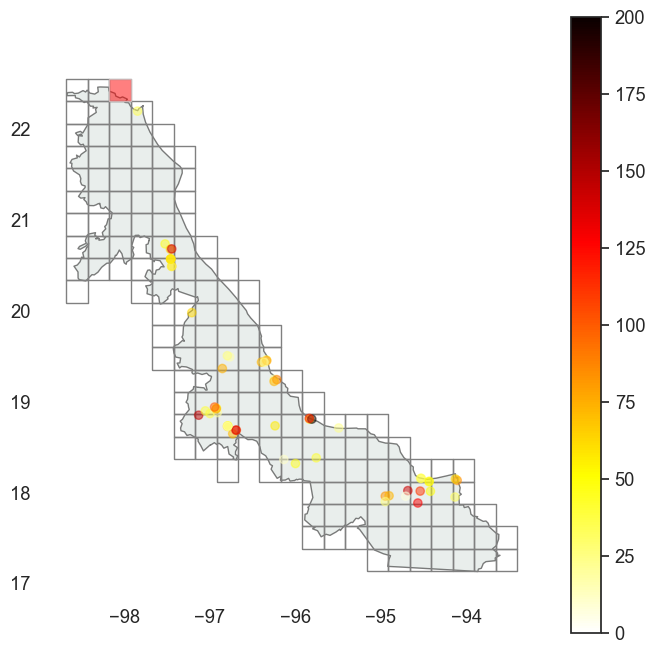

In [47]:
import seaborn as sns

cell = grid.iloc[(n_rows - 3 - 1) * n_cols + 2]['geometry']
cell_geom = cell
cell_gdf = gpd.GeoDataFrame(geometry=[cell_geom])

ax = geo_slice.plot(color='#d5deda', edgecolor='black', figsize=(8,8), alpha=.5)

sns.set_style("white")
sns.despine(left=True, bottom=True)
sns.set_context("notebook", font_scale=1.2)

grid.plot(ax=ax, color='none', edgecolor='grey')
cell_gdf.plot(ax=ax, color='red', alpha=0.5)

data = sina_gp[['geometry', 'rewards']]
data.plot(column='rewards', cmap='hot_r', legend=True, ax=ax, alpha=0.5)

#data = sina_gp[['geometry', 'TiempoViaje']]
#data.plot(column='TiempoViaje', cmap='Blues', legend=True, ax=ax, alpha=0.4)

plt.show()


In [99]:
todos_gp = gpd.read_file("C:\\repos\\591\\project\\data\\todos.geojson")
todos_gp

,id,TiempoViaje,Visibilidad,layer,geometry
0,0_0,0.869318,12.48,Puntos de Hallazgo,POINT (-110.98195 31.30222)
1,0_1,14.522824,6.31,Puntos de Hallazgo,POINT (-113.45805 31.31142)
2,0_2,13.308738,10.54,Puntos de Hallazgo,POINT (-109.86055 27.46833)
3,0_3,18.339829,6.25,Puntos de Hallazgo,POINT (-109.64796 23.10183)
4,0_4,25.672041,9.35,Puntos de Hallazgo,POINT (-102.31220 23.17014)
...,...,...,...,...,...
868,0_868,27.427640,8.30,Puntos de Hallazgo,POINT (-97.26904 25.83433)
869,0_869,14.400367,16.99,Puntos de Hallazgo,POINT (-104.87702 21.42497)
870,0_870,3.925064,31.67,Puntos de Hallazgo,POINT (-99.59031 17.91611)
871,0_871,19.207223,13.96,Puntos de Hallazgo,POINT (-104.88037 21.41972)


<Figure size 640x480 with 0 Axes>

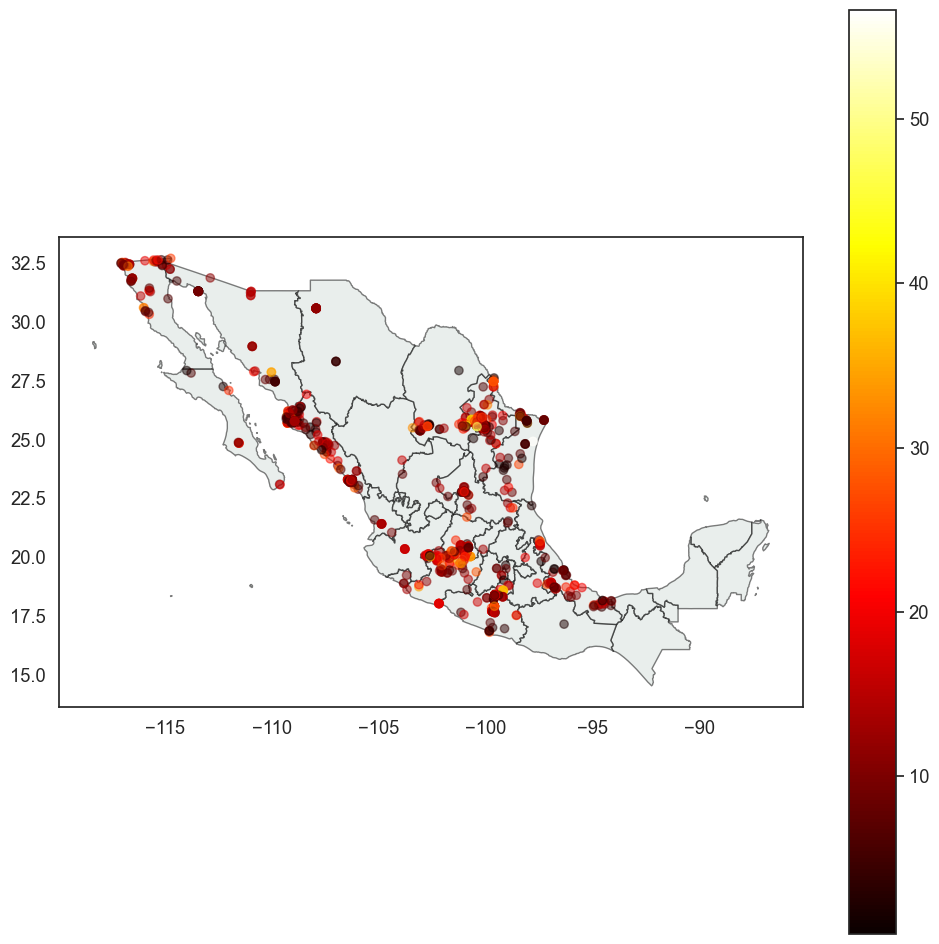

In [106]:

sns.set_style("white")
sns.despine(left=True, bottom=True)
sns.set_context("notebook", font_scale=1.2)
#geo_df.plot()

ax = geo_df.plot(color='#d5deda', edgecolor='black', figsize=(12,12), alpha=.5)

data = todos_gp[['geometry', 'Visibilidad']]
data.plot(column='Visibilidad', cmap='hot', legend=True, ax=ax, alpha=0.5)

plt.show()


In [49]:
sina_gp

,id,TiempoViaje,Visibilidad,layer,geometry,features,rewards
0,0_0,0.053310,0.202418,Puntos de Hallazgo,POINT (-97.52461 20.73558),21.929271,45.652836
1,0_1,0.472562,0.162349,Puntos de Hallazgo,POINT (-96.33708 19.45803),72.132370,38.182085
2,0_2,0.112105,0.419689,Puntos de Hallazgo,POINT (-96.85378 19.36461),58.479980,74.124577
3,0_3,0.015344,0.681520,Puntos de Hallazgo,POINT (-96.73261 18.64744),80.334884,71.503311
4,0_4,0.373236,0.613817,Puntos de Hallazgo,POINT (-96.68988 18.68605),118.755430,99.938016
...,...,...,...,...,...,...,...
57,0_57,0.074287,0.770639,Puntos de Hallazgo,POINT (-95.83583 18.81555),99.938016,118.755430
58,0_58,0.521005,0.109154,Puntos de Hallazgo,POINT (-96.33402 19.45145),71.503311,80.334884
59,0_59,0.050648,0.599309,Puntos de Hallazgo,POINT (-97.45738 20.56922),74.124577,58.479980
60,0_60,0.007155,0.371330,Puntos de Hallazgo,POINT (-96.39556 19.43500),38.182085,72.132370


In [50]:
joined = gpd.sjoin(grid, sina_gp, op='intersects')
reward_bool = joined.groupby('index_right').any()['rewards']


C:\Users\valer\AppData\Roaming\Python\Python310\site-packages\IPython\core\interactiveshell.py:3373: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):
C:\Users\valer\AppData\Local\Temp\ipykernel_5676\623852563.py:1: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  joined = gpd.sjoin(grid, sina_gp, op='intersects')


In [55]:
reward = joined.groupby(joined.index).size()
reward = (reward - reward.min()) / (reward.max() - reward.min())*200
grid['rewards'] = reward.astype(int)
grid = grid.fillna(0)


In [68]:
sina_gp.shape

(62, 7)

In [75]:
total_rewards = [round(sina_gp['rewards'][i]+grid['rewards'][i],0) for i in range (len(sina_gp['rewards']))]
total_rewards = (total_rewards - min(total_rewards)) / (max(total_rewards) - min(total_rewards))*200

re = []
for i in range(len(grid["rewards"])):
    if i < len(sina_gp["rewards"]):
        re.append(round(total_rewards[i],0))
    else:
        re.append(round(grid['rewards'][i],0))

grid['total_rewards'] = re

In [78]:
grid = grid.fillna(0)
grid["total_rewards"].unique()

array([ 33.,  27.,  53.,  51.,  71.,  25.,  97.,  11.,  49.,  57.,  31.,
        26.,  15.,  34.,  46., 100.,  13.,   1.,  36.,   0.,  16.,  23.,
       101.,  28.,  92.,  35., 184.,  29.,  32.,   5.,  79.,  52.,  61.,
        37.,  18.,  86.,  24.,  39., 104.,  64.,  54.,  10.,  41.,   8.,
        85., 200., 142., 114.])

In [1]:
geo_slice

NameError: name 'geo_slice' is not defined

In [2]:
from shapely.geometry import Point

def plot_episode(episode,state,show=False):
    cell = grid.iloc[-state]['geometry']
    cell_geom = cell
    cell_gdf = gpd.GeoDataFrame(geometry=[cell_geom])
    cell_coords=[(pt) for pt in list(cell.exterior.coords)]

    ax = geo_slice.plot(color='#d5deda', edgecolor='black', figsize=(8,8))

    sns.set_style("white")
    sns.despine(left=True, bottom=True)
    sns.set_context("notebook", font_scale=1.2)

    grid.plot(ax=ax, color='none', edgecolor='black')
    cell_gdf.plot(ax=ax, color='green',alpha=1)
    
    data = grid[['geometry', 'total_rewards']]
    data.plot(column='total_rewards', cmap='CMRmap_r', legend=True, ax=ax, alpha=0.7)

    plt.annotate('A', xy=cell_coords[0])
    plt.savefig("episode"+str(episode)+".png")
    #if show:
        #plt.show()

plot_episode(1,6,show=False)

NameError: name 'grid' is not defined

## Empezar a RL


Common functions

In [151]:
m = 26

out_space = []
out_space.append([[0,i]  for i in range(26) if i not in [i for i in range(5,8)]])
out_space.append([[1,i]  for i in range(26) if i not in [i for i in range(4,9)]])
out_space.append([[2,i]  for i in range(26) if i not in [i for i in range(1,10)]])
out_space.append([[3,i]  for i in range(26) if i not in [i for i in range(0,14)]])
out_space.append([[4,i]  for i in range(26) if i not in [i for i in range(0,16)]])
out_space.append([[5,i]  for i in range(26) if i not in [i for i in range(0,16)]])
out_space.append([[6,i]  for i in range(26) if i not in [i for i in range(4,15)]])
out_space.append([[7,i]  for i in range(26) if i not in [i for i in range(7,17)]])
out_space.append([[8,i]  for i in range(26) if i not in [i for i in range(8,18)]])
out_space.append([[9,i]  for i in range(26) if i not in [i for i in range(11,22)]])
out_space.append([[10,i] for i in range(26) if i not in [i for i in range(14,23)]])
out_space.append([[11,i] for i in range(26) if i not in [i for i in range(16,24)]])
out_space.append([[12,i] for i in range(26) if i not in [i for i in range(17,26)]])
out_space.append([[13,i] for i in range(26) if i not in [i for i in range(19,26)]])
out_space.append([[14,i] for i in range(26) if i not in [i for i in range(21,25)]])

In [89]:
#veracruz
m = 22
n = 22
out_space = []

out_space.append([[0,i]  for i in range(21) if i not in [i for i in range(0,3)]])
out_space.append([[1,i]  for i in range(21) if i not in [i for i in range(0,4)]])
out_space.append([[2,i]  for i in range(21) if i not in [i for i in range(0,5)]])
out_space.append([[3,i]  for i in range(21) if i not in [i for i in range(0,7)]])
out_space.append([[4,i]  for i in range(21) if i not in [i for i in range(0,7)]])
out_space.append([[5,i]  for i in range(21) if i not in [i for i in range(0,7)]])
out_space.append([[6,i]  for i in range(21) if i not in [i for i in range(0,7)]])
out_space.append([[7,i]  for i in range(21) if i not in [i for i in range(7,17)]])
out_space.append([[8,i]  for i in range(21) if i not in [i for i in range(0,8)]])
out_space.append([[9,i]  for i in range(21) if i not in [i for i in range(0,9)]])
out_space.append([[10,i] for i in range(21) if i not in [i for i in range(3,9)]])
out_space.append([[11,i] for i in range(21) if i not in [i for i in range(4,9)]])
out_space.append([[12,i] for i in range(21) if i not in [i for i in range(4,10)]])
out_space.append([[13,i] for i in range(21) if i not in [i for i in range(4,10)]])
out_space.append([[14,i] for i in range(21) if i not in [i for i in range(5,11)]])
out_space.append([[15,i] for i in range(21) if i not in [i for i in range(5,12)]])
out_space.append([[16,i] for i in range(21) if i not in [i for i in range(5,15)]])
out_space.append([[17,i] for i in range(21) if i not in [i for i in range(5,16)]])
out_space.append([[18,i] for i in range(21) if i not in [i for i in range(9,19)]])
out_space.append([[19,i] for i in range(21) if i not in [i for i in range(11,19)]])
out_space.append([[20,i] for i in range(21) if i not in [i for i in range(11,20)]])
out_space.append([[21,i] for i in range(21) if i not in [i for i in range(11,21)]])
out_space.append([[22,i] for i in range(21) if i not in [i for i in range(14,21)]])

In [94]:
grid

,geometry,rewards,total_rewards
0,"POLYGON ((-95.16184 17.13680, -94.91040 17.136...",0.0,33.0
1,"POLYGON ((-94.91040 17.13680, -94.65897 17.136...",0.0,27.0
2,"POLYGON ((-94.65897 17.13680, -94.40753 17.136...",0.0,53.0
3,"POLYGON ((-94.40753 17.13680, -94.15609 17.136...",0.0,51.0
4,"POLYGON ((-94.15609 17.13680, -93.90466 17.136...",0.0,71.0
...,...,...,...
149,"POLYGON ((-98.17907 22.05783, -97.92763 22.057...",0.0,0.0
150,"POLYGON ((-97.92763 22.05783, -97.67620 22.057...",0.0,0.0
151,"POLYGON ((-98.68194 22.30388, -98.43050 22.303...",0.0,0.0
152,"POLYGON ((-98.43050 22.30388, -98.17907 22.303...",0.0,0.0


In [93]:
def generate_rewards(out_space,m):
    total_r = list(grid["total_rewards"])
    rewards = np.zeros((22,21))
    k = 0
    for i in range(0,22):
        for j in range(0,21):
            if [i,j] in out_space[i]:
                r = 0
            else:
                print(k)
                r = total_r[k]
            rewards[i][j] = r
    return rewards

rewards = generate_rewards(out_space,m=21)

def obtain_terminal(rewards):
    #terminal is the value with the highest rewards
    return np.unravel_index(np.argmax(rewards), rewards.shape)

def check_outspace(out_space,trial_state):
    for i in range(len(out_space)):
        if trial_state in out_space[i]:
            return True
    return False

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154


IndexError: list index out of range

In [82]:
def move(st, action, terminal_state,out_space):
    if(action == 0):  #UP
        trial_state = [st[0]-1, st[1]]
    elif(action == 1):  #DOWN
        trial_state = [st[0]+1, st[1]]
    elif(action == 2):  #LEFT
        trial_state = [st[0], st[1]-1]
    elif(action == 3):  #RIGHT
        trial_state = [st[0], st[1]+1]

    # Outer walls
    stp = trial_state
    if check_outspace(out_space,stp) or stp[0] < 0 or stp[1] < 0 or stp[0] > 21-1 or stp[1] > 21-1:
        stp = st
    
    done = False
    if stp == terminal_state:
        done = True

    return stp,done

In [83]:
gamma = 0.999;alpha = 0.4;eps =.9
actions = [0,1,2,3]
num_actions = len(actions)

def e_greedy(eps,num_actions,state,Q):
    if np.random.rand() < eps:
        action = int(np.argmax(Q[state[0],state[1]]))
    else:
        action = np.random.randint(0, num_actions)
    return action

def soft_policy(prob):
    action=np.random.choice(*[range(0,len(prob))], p=prob); #print(action)
    return action

In [84]:
def obtain_flat_st(out_space,state,space):
    flat_st = 0
    for i in range(space.shape[1]):
        for j in reversed(range(space.shape[0])):
            if [i,j] not in out_space[i]:
                flat_st+=1
            if [i,j] == state:
                return flat_st
    return None

In [86]:
def run_episode(n_max=10,m=21,n=22,plot_episode=False):
    # Set up intial state
    state_in = False
    while state_in == False:
        st=[np.random.randint(n),np.random.randint(m)]
        if check_outspace(out_space,st):
            state_in = True

    # Set up environment
    space = np.zeros((m,n))

    # Cumulative reward
    Rtot=0 
    
    # Maps from grip to state index
    sid=np.array(*[range(0,m*m)]).reshape(m,m)
    sid=np.flip(sid)

    # State rewards

    # Terminal state
    done=False
    terminal_states = obtain_terminal(rewards)
    
    # Average rewards per state
    Rs=np.zeros((m,m)) 

    # Transition matrix
    P=np.zeros((m*m,m*m))
    num_steps=0

    prob = [0.25,0.25,0.25, 0.25]
    
    # Run simulation
    for t in range(1,n_max+1):
        
        #obtain flat state
        flat_state = obtain_flat_st(out_space,st,space)

        # Plot episode
        if plot_episode: plot_episode(t,flat_state,show=False)

        action = soft_policy(prob)
        stp1,done = move(st,action,terminal_states,out_space)
        i = 0 
        while i<3:
            if stp1 == st:
                action = soft_policy(prob)
                stp1,done = move(st,action,terminal_states,out_space)
                i+=1
            else:
                i=3

        # Update transition matrix
        try:
            P[sid[st[0],st[1]],sid[stp1[0],stp1[1]]]+=1; num_steps+=1
        except:
            print(st[0],st[1],stp1[0],stp1[1])

        # Reward for entering state
        Rt=rewards[stp1[0],stp1[1]]
        Rtot+=Rt
                
        # Update state
        st=stp1
        
    return [P/num_steps,Rt]

P=run_episode(n_max=50)
P[0][-1]

IndexError: index 20 is out of bounds for axis 0 with size 20

In [157]:
rewards = generate_rewards(out_space,m=26)
terminal_state = obtain_terminal(rewards)

In [158]:
def compute_converged_tm(m=26, n_episodes=1000):
    P = np.float64(np.zeros((m*m, m*m)))
    
    for i in range(n_episodes):
        ep = run_episode(n_max=12)[0]
        P += ep
    P /= n_episodes
    return P

converged_tm = compute_converged_tm(m=26, n_episodes=1000)
print(converged_tm)

[[0.    0.    0.    ... 0.    0.    0.   ]
 [0.    0.    0.    ... 0.    0.    0.   ]
 [0.    0.    0.    ... 0.    0.    0.   ]
 ...
 [0.    0.    0.    ... 0.003 0.    0.   ]
 [0.    0.    0.    ... 0.    0.001 0.   ]
 [0.    0.    0.    ... 0.    0.    0.004]]


In [25]:
df = pd.DataFrame(data=converged_tm.astype(float))
df.to_csv('converged.txt', sep=' ', header=False, float_format='%.4f', index=False)

First Visit MC-prediction

In [26]:
#set reward for current state to zero and initialize a matrix to store all rewards
Rc = 0
R = generate_rewards(out_space,m)

#input policy to be evaluated
def policy():
    p=[0.25,0.25,0.25, 0.25]
    action=np.random.choice(*[range(0,len(p))], p=p)
    return action

#initialize state_values
state_values = np.empty(m*m, dtype=object)
state_values[:] = [[] for _ in range(m*m)]

V = []
terminal_state = obtain_terminal(R)


def mc_first(V,state_values, gamma, num_episodes=100):
    #episode loop
    for i_episode in range(1, num_episodes+1):
        #generate an episode following SARSA
        episode = np.empty((m, m), dtype=object)
        episode[:] = [[[] for j in range(m)] for i in range(m)]
        for i in range(m):
            for j in range(m):
                #episode = S0A0R
                state = [i,j]
                action =policy()
                r = R[i][j]
                episode[i][j] = [state,action,r]
        flat_ep = episode.flatten()

        #define G
        G = 0
        #loop step in episode
        for i in range(m-1):
            for j in range(m):
                state = episode[i][j][0]
                r = episode[i][j][2]
                next_st = move(state, action, terminal_state,out_space)
                r_next = episode[next_st[0][0],next_st[0][1]][2]

                #G = gamma*G + R(step+1)
                G = gamma*G + r_next

                #append G to st
                state_values[i].append(G)
                
                #state_value = average(G)
                V.append(sum(state_values[i]) / len(state_values[i]))
    return V

svalues_mc_first = mc_first(V,state_values, gamma)

In [27]:
round_svmc = [round(i,2) for i in svalues_mc_first]
svalues = [round_svmc[i:i+26] for i in range(0, 676, 6)]
for row in svalues:
    print(row)
df = pd.DataFrame(data=svalues)
df.to_csv('mc_fv.txt', sep=' ', header=False, float_format='%.4f', index=False)

[0.0, 0.0, 0.0, 0.0, 2.98, 7.87, 13.86, 20.61, 27.36, 32.76, 37.16, 40.83, 43.92, 46.57, 48.86, 50.86, 52.62, 54.17, 55.56, 56.81, 57.93, 58.95, 59.88, 60.72, 61.5, 62.21]
[13.86, 20.61, 27.36, 32.76, 37.16, 40.83, 43.92, 46.57, 48.86, 50.86, 52.62, 54.17, 55.56, 56.81, 57.93, 58.95, 59.88, 60.72, 61.5, 62.21, 79.94, 85.4, 89.99, 96.31, 102.93, 120.04]
[43.92, 46.57, 48.86, 50.86, 52.62, 54.17, 55.56, 56.81, 57.93, 58.95, 59.88, 60.72, 61.5, 62.21, 79.94, 85.4, 89.99, 96.31, 102.93, 120.04, 148.05, 171.21, 191.05, 208.31, 222.4, 234.11]
[55.56, 56.81, 57.93, 58.95, 59.88, 60.72, 61.5, 62.21, 79.94, 85.4, 89.99, 96.31, 102.93, 120.04, 148.05, 171.21, 191.05, 208.31, 222.4, 234.11, 243.99, 252.43, 259.73, 266.08, 271.67, 276.62]
[61.5, 62.21, 79.94, 85.4, 89.99, 96.31, 102.93, 120.04, 148.05, 171.21, 191.05, 208.31, 222.4, 234.11, 243.99, 252.43, 259.73, 266.08, 271.67, 276.62, 281.03, 284.98, 288.54, 291.76, 294.68, 297.34]
[102.93, 120.04, 148.05, 171.21, 191.05, 208.31, 222.4, 234.11,

Monte Carlo ES (Exploring Starts)

In [28]:
#set reward for current state to zero and initialize a matrix to store all rewards
Rc = 0
R = generate_rewards(out_space,m)
P=np.zeros((m*m,m*m))

#input policy to be evaluated
def mc_es(P,gamma, num_episodes=100):
    #initialize Q(state_values)
    Q = np.zeros((m, m, num_actions))

    #initialize state_actions list
    state_actions = np.full((m, m, num_actions), -1)
    #episode loop
    for i_episode in range(1, num_episodes+1):

        #choose a random state_action
        x = np.random.choice(np.arange(m), size=2, replace=False)
        y = np.random.choice(np.arange(num_actions), size=1, replace=False)
        state_act = [x[0],x[1],y]
        
        #generate an episode following SARSA
        episode = np.empty((m, m), dtype=object)
        episode[:] = [[[] for j in range(m)] for i in range(m)]
        for i in range(m):
            for j in range(m):
                #episode = S0A0R
                state = [i,j]
                action =policy()
                r = R[i][j]
                episode[i][j] = [state,action,r]

        #define G
        G = 0

        #loop step in episode
        for i in range(m-1):
            for j in range(m):
                state = episode[i][j][0]
                r = episode[i][j][2]
                next_st = move(state, action, terminal_state,out_space)

                r_next = episode[next_st[0][0],next_st[0][1]][2]

                #G = gamma*G + R(step+1)
                G = gamma*G + r_next

                #if state_action not in state_actions:                
                if state_actions[state_act[0],
                                 state_act[1],
                                 state_act[2]] == -1:
                    #append G to st
                    state_actions[state_act[0],
                                 state_act[1],
                                 state_act[2]] = G

                    #Q(state_action) = G
                    Q[state_act[0],
                                 state_act[1],
                                 state_act[2]] = G

                    #policy(state) = argmax Q(state_values)
                    P[state_act[0],state_act[1]] = np.argmax(Q)
    return P


policy_mc_es = mc_es(converged_tm,gamma)

In [29]:
for i in policy_mc_es:
    print(i)

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

On-policy first-visit MC

In [30]:
Rc = 0
R = generate_rewards(out_space,m)
P=np.zeros((m*m,m*m))

def mc_op(Pol,gamma, num_episodes=100):
    #input policy to be evaluated
    P = Pol
    #initialize Q(state_values)
    Q = np.zeros((m, m, num_actions))

    #initialize state_actions list
    state_actions = np.full((m, m, num_actions), -1)
    #episode loop
    for i_episode in range(1, num_episodes+1):

        #choose a random state_action
        x = np.random.choice(np.arange(m), size=2, replace=False)
        y = np.random.choice(np.arange(num_actions), size=1, replace=False)
        state_act = [x[0],x[1],y]
        
        #generate an episode following SARSA
        episode = np.empty((m, m), dtype=object)
        episode[:] = [[[] for j in range(m)] for i in range(m)]
        for i in range(m):
            for j in range(m):
                #episode = S0A0R
                state = [i,j]
                action =policy()
                r = R[i][j]
                episode[i][j] = [state,action,r]

        #define G
        G = 0

        #loop step in episode
        for i in range(m-1):
            for j in range(m):
                state = episode[i][j][0]
                r = episode[i][j][2]
                action = episode[i][j][1]
                next_st = move(state, action, terminal_state,out_space)
                if next_st[0][0] or next_st[0][1] == 26:
                    next_st = [state]
                r_next = episode[next_st[0][0],next_st[0][1]][2]

                #G = gamma*G + R(step+1)
                G = gamma*G + r_next

                #if state_action not in state_actions:                
                if state_actions[state_act[0],
                                 state_act[1],
                                 state_act[2]] == -1:
                    #append G to st
                    state_actions[state_act[0],
                                 state_act[1],
                                 state_act[2]] = G

                    #Q(state_action) = G
                    Q[state_act[0],
                                 state_act[1],
                                 state_act[2]] = G
                    
                    Q_max_index = np.unravel_index(np.argmax(Q), Q.shape)
                    action_sub = Q_max_index[2]

                    #for all actions in state_actions:
                    for index, value in np.ndenumerate(state_actions):
                        i, j, k = index
                        #action ==  A*:<br>
                        if state_act[2] ==  action_sub:
                            #policy(action | state) = 1-$\varepsilon$ +$\varepsilon$ /| state_actions<br>
                            P[state_act[0],state_act[1]] = 1-eps + (eps/ abs(state_actions[i][j][k]))
                        
                        #elif action !=  A*:<br>
                        elif state_act[2] !=  action_sub:
                            #policy(action | state) = $\varepsilon$ /| state_actions<br>
                            P[state_act[0],state_act[1]] = eps/ abs(state_actions[i][j][k])
    return P,Q
policy_mc_op,Q_mc_op = mc_op(P,gamma)

C:\Users\valer\AppData\Local\Temp\ipykernel_10052\2996229019.py:77: RuntimeWarning: divide by zero encountered in divide
  P[state_act[0],state_act[1]] = eps/ abs(state_actions[i][j][k])
C:\Users\valer\AppData\Local\Temp\ipykernel_10052\2996229019.py:72: RuntimeWarning: divide by zero encountered in divide
  P[state_act[0],state_act[1]] = 1-eps + (eps/ abs(state_actions[i][j][k]))


In [31]:
for i in policy_mc_op:
    print(i)

[0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.9 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 

In [32]:
Q_mc_op[-1]

array([[0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.]])

 Off-policy MC control algorithm for estimating the optimal policy

In [33]:
Rc = 0
R = generate_rewards(out_space,m)
P=np.zeros((m*m,m*m))
Rs = np.zeros((m,m))

#b = any soft policy
#e_greedy() previously defined


def mc_off_p(gamma, num_episodes=100):
    #initialize Q(state_values)
    Q = np.zeros((m, m, num_actions))

    #initialize policy =  argmax Q(state_values)
    P = np.zeros((m, m))
    for i in range(m):
        for j in range(m):
            P[i, j] = np.max(Q[i, j, :])

    #initialize C(state_action) = 0
    C = np.zeros((m, m, num_actions))
    
    #episode loop
    for i_episode in range(1, num_episodes+1):       
        #generate an episode following SARSA using b policy
        episode = np.empty((m, m), dtype=object)
        episode[:] = [[[] for j in range(m)] for i in range(m)]
        for i in range(m):
            for j in range(m):
                #episode = S0A0R
                state = [i,j]
                action = e_greedy(eps, num_actions, state, Q)
                r = R[i][j]
                episode[i][j] = [state,action,r]

        #define G
        G = 0

        #define G
        W = 1

        #loop step in episode
        for i in range(m):
            for j in range(m):
                state = episode[i][j][0]
                action = episode[i][j][1]
                r = episode[i][j][2]
                next_st = move(state, action, terminal_state,out_space)
                if next_st[0][0] or next_st[0][1] == 26:
                    next_st = [state]
                r_next = episode[next_st[0][0],next_st[0][1]][2]

                #G = gamma*G + R(step+1)
                G = gamma*G + r_next
                
                #C(state_action) = C(state_action) + W
                C[state[0]][state[1]][action] = C[state[0]][state[1]][action] + W

                #Q(state_action) = Q(state_action) + W/C(state_action)
                # * [G-Q(state_action)]]
                sub_form_1 = Q[state[0]][state[1]][action] + (W / C[state[0]][state[1]][action])
                sub_form_2 = (G-Q[state[0]][state[1]][action])
                Q[state[0]][state[1]][action] = sub_form_1 * sub_form_2
                
                #policy(state) = argmax Q(state_values)
                P[state[0],state[1]] = np.argmax(Q)

                #if A != policy(state): <br>
                if action != P[state[0],state[1]]:
                    break

                #else: W = W(1/b(A|state))
                else: 
                    W = W * (1/(e_greedy(eps, num_actions, state, Q)+ .000001))
    return P,Q

policy_mc_off, Q_mc_off = mc_off_p(gamma)

C:\Users\valer\AppData\Local\Temp\ipykernel_10052\4183402143.py:63: RuntimeWarning: overflow encountered in double_scalars
  Q[state[0]][state[1]][action] = sub_form_1 * sub_form_2


In [34]:
print(policy_mc_off)


[[20.  0.  0.  0.  0. 20.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.  0.]
 [20.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.  0.]
 [20.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.  0.]
 [20.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.  0.]
 [20.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.  0.]
 [20.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.  0.]
 [20.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.  0.]
 [20.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.  0.]
 [20.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.  0.]
 [20.  0.  0.  0.  

Q-learning (off-policy TD control) for estimating the optimal policy

In [55]:
#Q-learning (off-policy TD control) for estimating the optimal policy
#initialize Q(state_values)
Q = np.zeros((m, m, num_actions))

#set reward for current state to zero and initialize a matrix to store all rewards
Rc = 0
R = generate_rewards(out_space,m)
P=np.zeros((m*m,m*m))
Rs = np.zeros((m, m))
space = np.zeros((m,15))


def Q_learn_offp(Q, alpha, gamma, eps, num_episodes=10):
    ep_r = {}
    #episode loop
    for i_episode in range(1, num_episodes+1):
        #initialize state
        state_in = False
        while state_in == False:
            state=[np.random.randint(15),np.random.randint(m)]
            if check_outspace(out_space,state):
                state_in = True
        
        #loop step in episode until s = terminal
        done = False
        jk = 0
        while done is False and jk<100000:
            jk +=1
            #choose A from state using egreedy derived from Q
            action = e_greedy(eps, num_actions, state, Q)
            next_s, done = move(state, action, terminal_state,out_space)
            
            i = 0 
            while i<3:
                if next_s == state:
                    action = e_greedy(eps, num_actions, state, Q)
                    next_s,done = move(state,action,terminal_state,out_space)
                    i+=1
                else:
                    i=3

            #take action A and obtain R, next_state
            reward = R[state[0], state[1]]
            #calculate Q 
            Q[state[0], state[1]][action] += alpha * (reward + gamma * Q[next_s[0], next_s[1]][action] - Q[state[0], state[1]][action])
            
            #state = next_state
            state = next_s
        ep_r[i_episode] = Rc
    return [Q,ep_r]

a = Q_learn_offp(Q, alpha, gamma, eps =.8)
q3 = a[0]
epr = a[1]

In [56]:
q3

array([[[  0.        ,   0.        ,   0.        ,   0.        ],
        [  0.        ,   0.        ,   0.        ,   0.        ],
        [  0.        ,   0.        ,   0.        ,   0.        ],
        ...,
        [  0.        ,   0.        ,   0.        ,   0.        ],
        [  0.        ,   0.        ,   0.        ,   0.        ],
        [  0.        ,   0.        ,   0.        ,   0.        ]],

       [[  0.        ,   0.        ,   0.        ,   0.        ],
        [  0.        ,   0.        ,   0.        ,   0.        ],
        [  0.        ,   0.        ,   0.        ,   0.        ],
        ...,
        [  0.        ,   0.        ,   0.        ,   0.        ],
        [  0.        ,   0.        ,   0.        ,   0.        ],
        [  0.        ,   0.        ,   0.        ,   0.        ]],

       [[  0.        ,   0.        ,   0.        ,   0.        ],
        [  0.        , 146.74596272,  13.19860265,  24.6408401 ],
        [  0.        ,   8.69105502,  21.59964

In [57]:
#SARSA (on-policy TD) for estimating action-values
#initialize Q(state_values)
Q = q3

#set reward for current state to zero and initialize a matrix to store all rewards
Rc = 0
m = 26
R = generate_rewards(out_space,m)
P=np.zeros((m*m,m*m))

def sarsa_on_q(Q, alpha, gamma, eps, num_episodes=10):
    #episode loop
    for i_episode in range(1, num_episodes+1):
        #initialize state
        # Set up intial state
        state_in = False
        while state_in == False:
            state=[np.random.randint(15),np.random.randint(m)]
            if check_outspace(out_space,state):
                state_in = True
        
        #choose A from state using egreedy derived from Q
        action = e_greedy(eps, num_actions, state, Q)
            
        #loop step in episode until s = terminal
        done = False
        jk=0
        AAA = []
        while done is False and jk <1000000:
            jk+=1
            #take action A and obtain R, next_state
            next_s, done = move(state, action, terminal_state,out_space)
            i = 0 
            while i<3:
                if next_s == state:
                    action = e_greedy(eps, num_actions, state, Q)
                    next_s,done = move(state,action,terminal_state,out_space)
                    i+=1
                else:
                    i=3
            AAA.append(next_s)
            #flat_state = obtain_flat_st(out_space,next_s,space)
            #plot_episode(jk,flat_state,show=False)

            reward = R[state[0], state[1]]

            #choose next_action from next_state using egreedy derived from Q
            next_action = e_greedy(eps, num_actions, next_s, Q)

            #calculate Q
            Q[state[0], state[1]][action] += alpha * (reward + gamma * Q[next_s[0], next_s[1]][next_action] - Q[state[0], state[1]][action])
            
            #state = next_state
            state, action = next_s, next_action
        return Q,AAA

Q_sarsa_on,AAA = sarsa_on_q(Q, alpha, gamma, eps=.8888)

In [60]:
df = pd.DataFrame(data=AAA)
df.to_csv('sarsa_actions3.txt', sep=' ', header=False, float_format='%.4f', index=False)

In [65]:
df = pd.DataFrame(data=rewards)
df.to_csv('rewards.csv', header=False, float_format='%.4f', index=False)


In [67]:
sina_gp.head(1)

,id,TiempoViaje,Visibilidad,layer,geometry,features,rewards
0,0_0,0.086575,0.102564,Puntos de Hallazgo,POINT (-106.35120 23.18333),28.80877,19.789107


# Training

In [75]:
sina_gp['label'] = pd.cut(sina_gp['rewards'], bins=[-float('inf'), 30, float('inf')], labels=[0, 1])
sina_gp.head(3)

,id,TiempoViaje,Visibilidad,layer,geometry,features,rewards,label
0,0_0,0.086575,0.102564,Puntos de Hallazgo,POINT (-106.35120 23.18333),28.808770,19.789107,0
1,0_1,0.778642,0.000000,Puntos de Hallazgo,POINT (-109.28108 25.70714),126.109343,25.963205,0
2,0_2,0.133743,0.000000,Puntos de Hallazgo,POINT (-107.62645 24.88558),19.665439,14.410907,0


In [76]:
sina_gp['label'].value_counts()

0    87
1    60
Name: label, dtype: int64

In [77]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

X_train, X_test, y_train, y_test = train_test_split(sina_gp[['total_rewards']], sina_gp['label'], test_size=0.3, random_state=42)


In [85]:
results_knn = {}
for i in range(10,110,10):
    # Train a KNN model
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train)
    # Predict the labels for the testing set
    y_pred = knn.predict(X_test)
    # Calculate the accuracy of the model
    accuracy = accuracy_score(y_test, y_pred)
    results_knn[i] = (accuracy*100)
results_knn

{10: 46.666666666666664,
 20: 51.11111111111111,
 30: 48.888888888888886,
 40: 46.666666666666664,
 50: 51.11111111111111,
 60: 48.888888888888886,
 70: 48.888888888888886,
 80: 48.888888888888886,
 90: 48.888888888888886,
 100: 48.888888888888886}

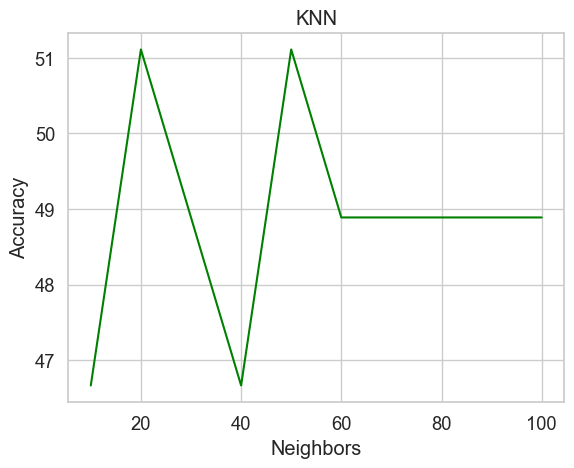

In [86]:
sns.set_style("whitegrid")
sns.lineplot(results_knn,color="green")
plt.title("KNN")
plt.xlabel("Neighbors")
plt.ylabel("Accuracy")
plt.show()


In [122]:
grid.head(1)

,geometry,rewards,total_rewards
0,"POLYGON ((-106.07263 22.46770, -105.91192 22.4...",0.0,12.944984


0    86
1    56
Name: label, dtype: int64

In [132]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

# Define a custom dataset class to load the data
class CustomDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.Tensor(X.values)
        self.y = torch.Tensor(y.values).long()

    def __len__(self):
        return len(self.X)

    def __getitem__(self, index):
        return self.X[index], self.y[index]

# Create PyTorch datasets and data loaders
train_dataset = CustomDataset(X_train, y_train)
test_dataset = CustomDataset(X_test, y_test)
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16)

# Define a simple neural network
class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(2, 16)
        self.fc2 = nn.Linear(16, 2)

    def forward(self, x):
        x = nn.functional.relu(self.fc1(x))
        x = self.fc2(x)
        return x

# Create an instance of the neural network
net = Net()

# Define the loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(net.parameters(), lr=0.001)

# Train the neural network
for epoch in range(10):
    for i, (inputs, labels) in enumerate(train_loader):
        optimizer.zero_grad()
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

# Test the neural network
correct = 0
total = 0
with torch.no_grad():
    for inputs, labels in test_loader:
        outputs = net(inputs)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

# Print the accuracy
accuracy = 100 * correct / total
print('Accuracy: %.2f%%' % accuracy)


RuntimeError: mat1 and mat2 shapes cannot be multiplied (16x1 and 2x16)

In [102]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

# Define a custom dataset class to load the data
class CustomDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.Tensor(X.values)
        self.y = torch.Tensor(y.values).long()

    def __len__(self):
        return len(self.X)

    def __getitem__(self, index):
        return self.X[index], self.y[index]

# Create PyTorch datasets and data loaders
train_dataset = CustomDataset(X_train, y_train)
test_dataset = CustomDataset(X_test, y_test)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32)

# Define a simple neural network
class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(2, 32)
        self.fc2 = nn.Linear(32, 2)

    def forward(self, x):
        x = nn.functional.relu(self.fc1(x))
        x = self.fc2(x)
        return x

# Create an instance of the neural network
net = Net()

# Define the loss function and optimizer
criterion = nn.CrossEntropyLoss()

# Train the neural network and store the accuracy through the epochs
accuracy_list = {}
lrate =0.1

for epoch in range(10):
    lrate = lrate/10
    optimizer = optim.Adam(net.parameters(), lr=lrate)
    for i, (inputs, labels) in enumerate(train_loader):
        optimizer.zero_grad()
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

    # Test the neural network
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = net(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    # Calculate the accuracy and store it in the accuracy_list
    accuracy = 100 * correct / total
    accuracy_list[lrate] = accuracy

# Print the accuracy list
print('Accuracy list:', accuracy_list)


Accuracy list: {0.01: 48.888888888888886, 0.001: 48.888888888888886, 0.0001: 48.888888888888886, 1e-05: 48.888888888888886, 1.0000000000000002e-06: 48.888888888888886, 1.0000000000000002e-07: 48.888888888888886, 1.0000000000000002e-08: 48.888888888888886, 1.0000000000000003e-09: 48.888888888888886, 1.0000000000000003e-10: 48.888888888888886, 1.0000000000000003e-11: 48.888888888888886}


## Integrate this with deep RL

In [159]:
grid['label'] = pd.cut(grid['total_rewards'], bins=[-float('inf'), 25, float('inf')], labels=[0, 1])
X_train, X_test, y_train, y_test = train_test_split(grid[['total_rewards']], grid['label'], test_size=0.3, random_state=42)

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split

# Define a custom dataset class to load the data
class CustomDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.Tensor(X.values)
        self.y = torch.Tensor(y.values).long()

    def __len__(self):
        return len(self.X)

    def __getitem__(self, index):
        return self.X[index], self.y[index]

# Create PyTorch datasets and data loaders
train_dataset = CustomDataset(X_train, y_train)
test_dataset = CustomDataset(X_test, y_test)
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16)

# Define a simple neural network
class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(1, 16)
        self.fc2 = nn.Linear(16, 2)

    def forward(self, x):
        x = nn.functional.relu(self.fc1(x))
        x = self.fc2(x)
        return x

# Create an instance of the neural network
net = Net()

# Define the loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(net.parameters(), lr=0.001)

# Train the neural network and store the accuracy through the epochs
accuracy_list = []
for epoch in range(10):
    for i, (inputs, labels) in enumerate(train_loader):
        optimizer.zero_grad()
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

    # Test the neural network
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = net(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    # Calculate the accuracy and store it in the accuracy_list
    accuracy = 100 * correct / total
    accuracy_list.append(accuracy)

# Print the accuracy list
print('Accuracy list:', accuracy_list)


Accuracy list: [58.13953488372093, 58.13953488372093, 53.48837209302326, 44.18604651162791, 44.18604651162791, 51.16279069767442, 62.7906976744186, 74.4186046511628, 86.04651162790698, 83.72093023255815]


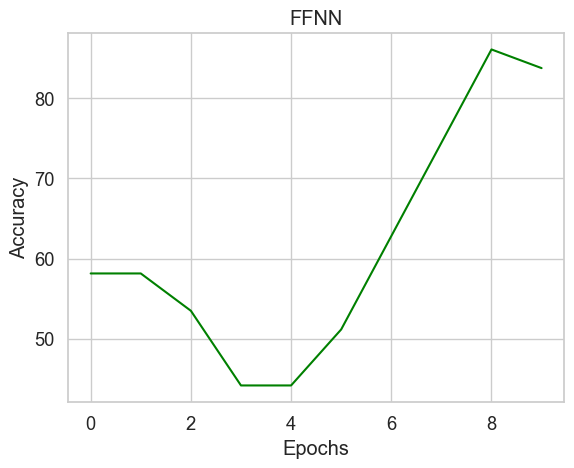

In [164]:
sns.set_style("whitegrid")
sns.lineplot(x=range(10),y=accuracy_list,color="green")
plt.title("FFNN")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.show()


In [168]:
grid[:3]

,geometry,rewards,total_rewards,label
0,"POLYGON ((-106.07263 22.46770, -105.91192 22.4...",0.0,12.944984,0
1,"POLYGON ((-105.91192 22.46770, -105.75120 22.4...",0.0,16.828479,0
2,"POLYGON ((-105.75120 22.46770, -105.59048 22.4...",0.0,9.061489,0


In [170]:
def prediction(df):
    X = torch.Tensor(df[['total_rewards']].values)
    outputs = net(X)
    _, predicted = torch.max(outputs.data, 1)

    if 1 in predicted:
        return df.iloc[predicted.numpy().tolist().index(1)]
    else:
        return df.sample().iloc[0]
    
prediction(grid[:3])

def deep_policy(df):
    prediction(sina_gp[:5])
    return action

prediction(grid[:3])


geometry         POLYGON ((-105.91191580671322 22.4676992197341...
rewards                                                        0.0
total_rewards                                            16.828479
label                                                            0
Name: 1, dtype: object

In [ ]:
#SARSA (on-policy TD) for estimating action-values
#initialize Q(state_values)
Q = q3

#set reward for current state to zero and initialize a matrix to store all rewards
Rc = 0
m = 26
R = generate_rewards(out_space,m)
P=np.zeros((m*m,m*m))

def sarsa_on_q(Q, alpha, gamma, eps, num_episodes=10):
    #episode loop
    for i_episode in range(1, num_episodes+1):
        #initialize state
        # Set up intial state
        state_in = False
        while state_in == False:
            state=[np.random.randint(15),np.random.randint(m)]
            if check_outspace(out_space,state):
                state_in = True
        
        #choose A from state using egreedy derived from Q
        action = e_greedy(eps, num_actions, state, Q)
            
        #loop step in episode until s = terminal
        done = False
        jk=0
        AAA = []
        while done is False and jk <1000000:
            jk+=1
            #take action A and obtain R, next_state
            next_s, done = move(state, action, terminal_state,out_space)
            
            AAA.append(next_s)
            #flat_state = obtain_flat_st(out_space,next_s,space)
            #plot_episode(jk,flat_state,show=False)

            reward = R[state[0], state[1]]

            #choose next_action from next_state using egreedy derived from Q
            next_action = e_greedy(eps, num_actions, next_s, Q)

            #calculate Q
            Q[state[0], state[1]][action] += alpha * (reward + gamma * Q[next_s[0], next_s[1]][next_action] - Q[state[0], state[1]][action])
            
            #state = next_state
            state, action = next_s, next_action
        return Q,AAA

Q_sarsa_on,AAA = sarsa_on_q(Q, alpha, gamma, eps=.8888)

c:\Users\valer\miniconda3\lib\site-packages\geopandas\plotting.py:673: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=figsize)


KeyboardInterrupt: 

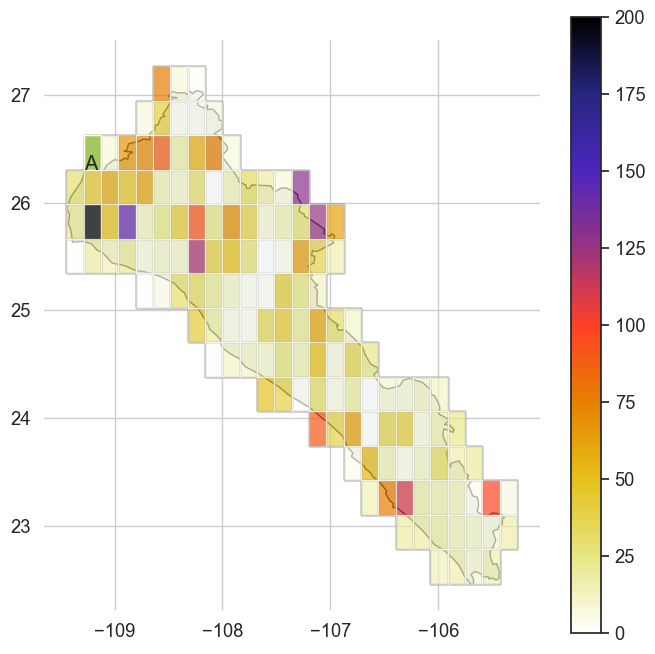

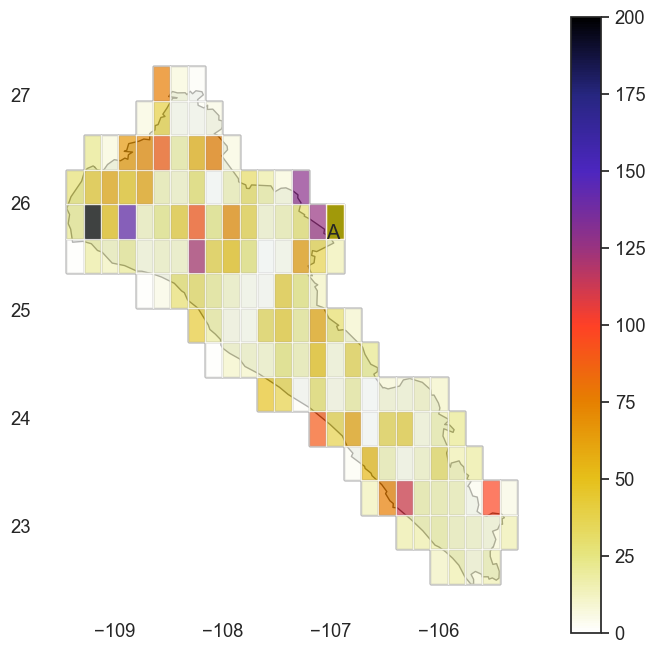

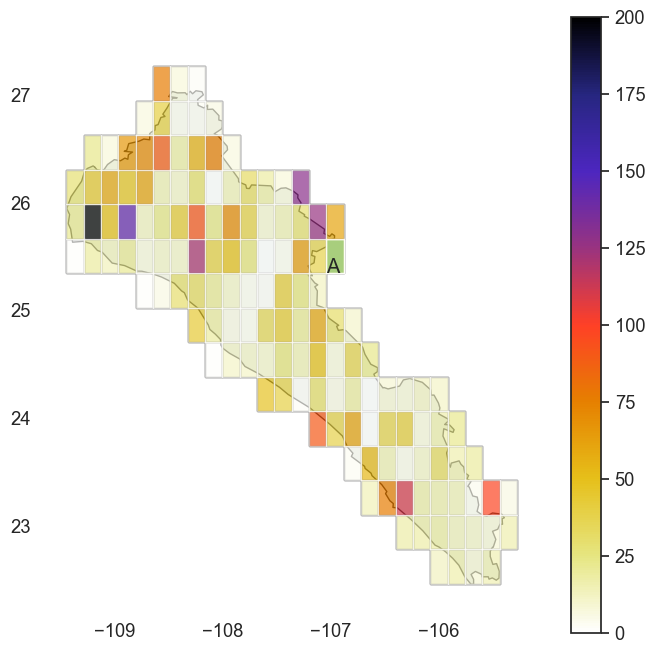

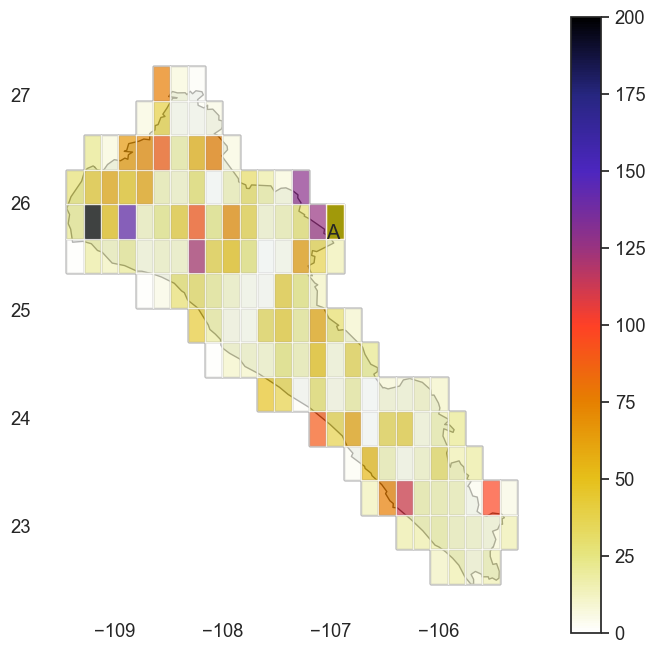

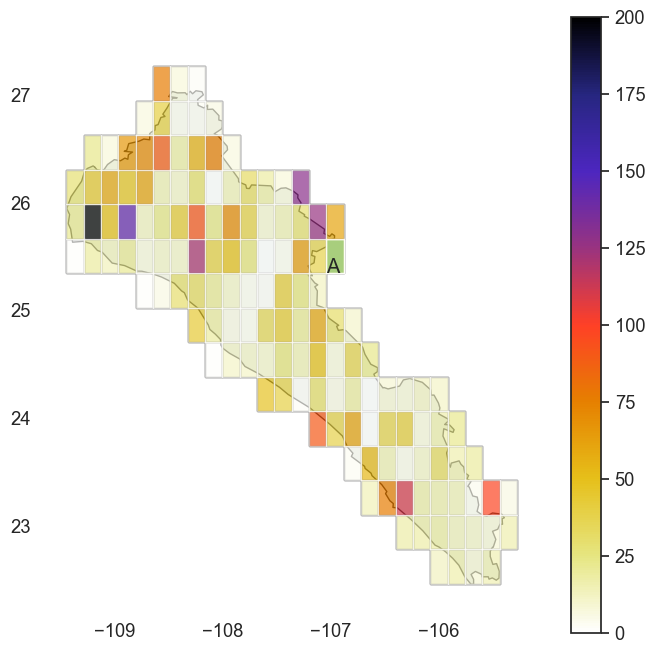

...

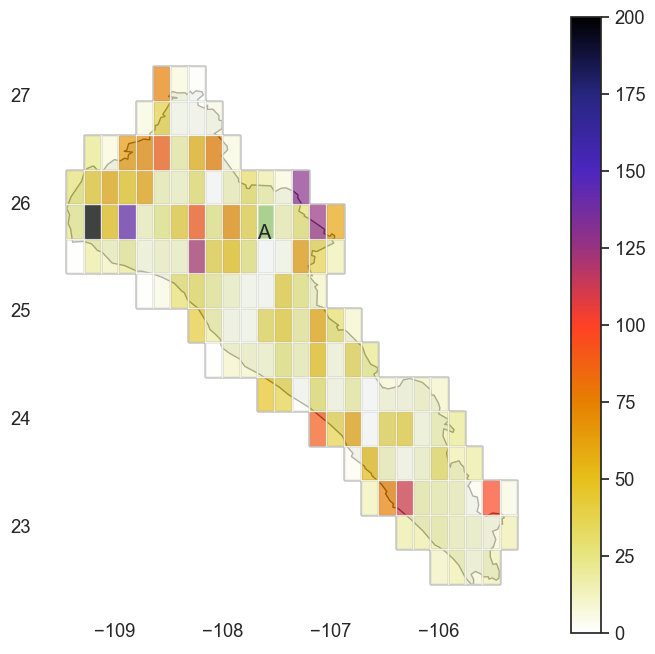

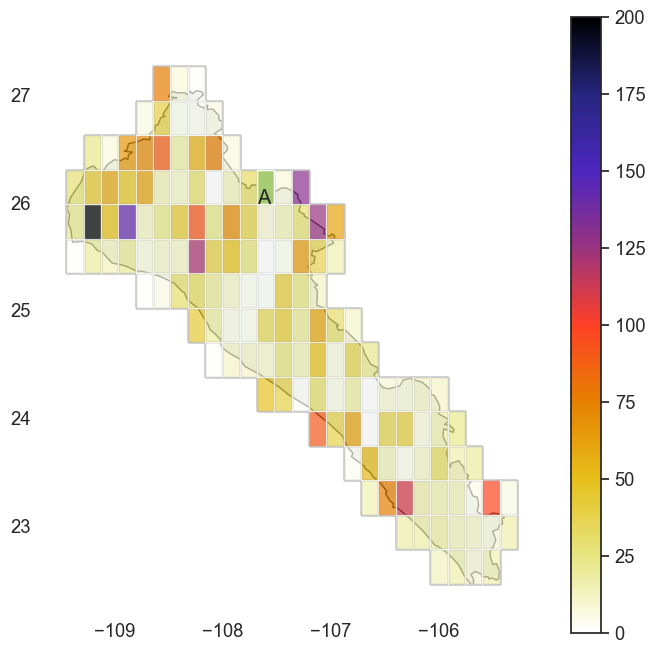

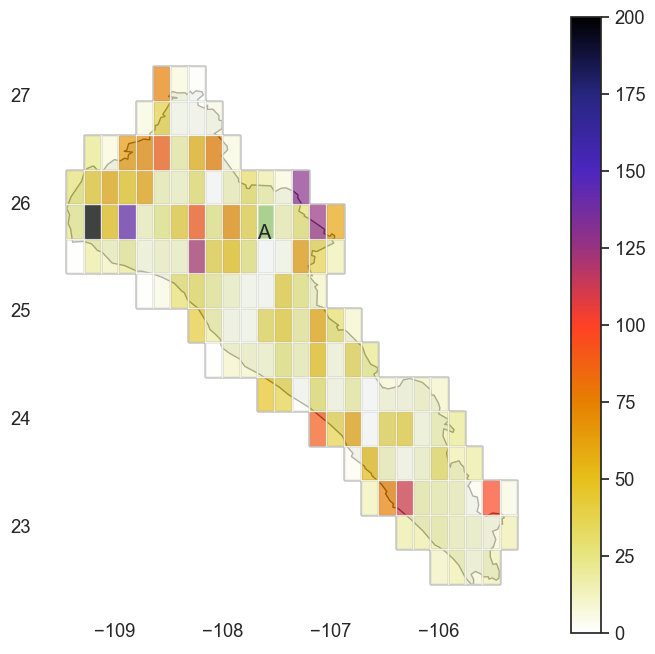

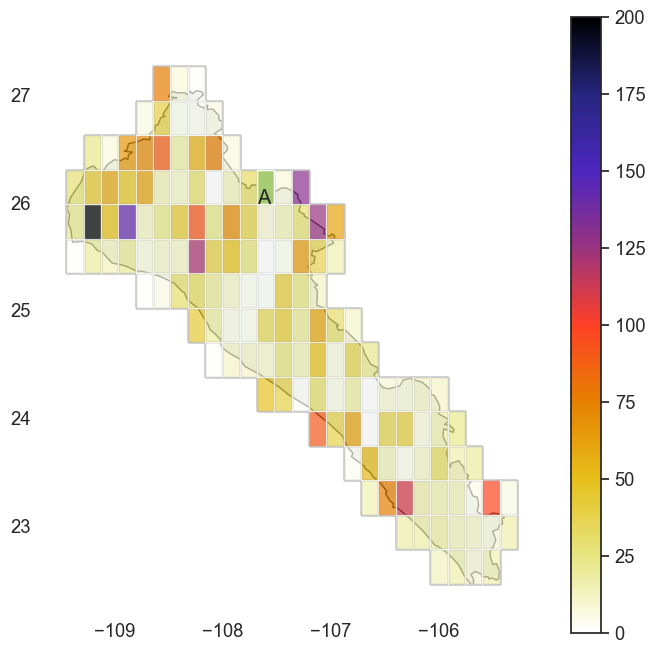

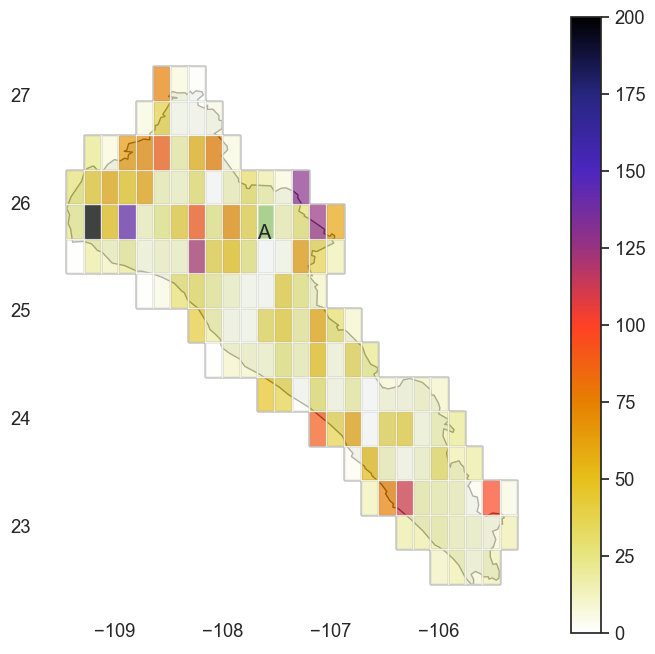

In [181]:
b = 0
for i in range(len(AAA)):
    if b != AAA[i]:
        flat_state = obtain_flat_st(out_space,AAA[i],space)
        plot_episode(i,flat_state)
    b = AAA[i]

Veracruz